<a href="https://colab.research.google.com/github/amanbagrecha/MyProjects/blob/master/pystac_rasterio.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import json
import pprint
from copy import deepcopy
import geopandas as gpd
import hvplot.pandas
import pandas as pd
import rasterio
import shapely.geometry
from pystac_client import Client
from rasterio.enums import Resampling
from rasterio.merge import merge
from rasterio.plot import show
import numpy as np

In [ ]:
URL = 'https://earth-search.aws.element84.com/v0/'

client = Client.open(URL)

with open('highway-yt.geojson') as src:
  mygeojson = json.load(src)

df = pd.DataFrame(mygeojson['features'])

# create geodataframe for our region of study
gdf = gpd.GeoDataFrame(
    df, geometry = df.geometry.apply(lambda x:  shapely.geometry.shape(x))
)

In [ ]:
# plot polygons as lines on a map with background tiles.
def plot_polygons(data, *args, **kwargs):
    return data.hvplot.paths(*args, geo=True, tiles='OSM', xaxis=None, yaxis=None,
                             frame_width=800, frame_height=400,
                             line_width=4, **kwargs)

In [ ]:
plot_polygons(gdf)

:Overlay
   .Tiles.I :Tiles   [x,y]
   .Path.I  :Path   [Longitude,Latitude]

In [ ]:
search = client.search(
    max_items = 10,
    collections = "sentinel-s2-l2a-cogs",
    bbox = gdf.total_bounds,
    datetime = '2022-01-01/2022-01-24'
)

print(f"AOI as Shapely Geometry object from shape(), found {len(list(search.items()))} items")

AOI as Shapely Geometry object from shape(), found 10 items


In [ ]:
# retrieve the items as dictionaries, rather than Item objects
items = list(search.items_as_dicts())
len(items)

10

In [ ]:
# convert a list of STAC Items into a GeoDataFrame
def items_to_geodataframe(items):
    _items = []
    for i in items:
        _i = deepcopy(i)
        _i['geometry'] = shapely.geometry.shape(_i['geometry'])
        _items.append(_i)
    gdf = gpd.GeoDataFrame(pd.json_normalize(_items))
    for field in ['properties.datetime', 'properties.created', 'properties.updated']:
        if field in gdf:
            gdf[field] = pd.to_datetime(gdf[field])
    gdf.set_index('properties.datetime', inplace=True)
    return gdf

In [ ]:
# convert found items to a GeoDataFrame
items_gdf = items_to_geodataframe(items)
items_gdf.head(3)

,type,stac_version,stac_extensions,id,bbox,geometry,collection,links,properties.platform,properties.constellation,...,assets.WVP.href,assets.WVP.proj:shape,assets.WVP.proj:transform,assets.SCL.title,assets.SCL.type,assets.SCL.roles,assets.SCL.href,assets.SCL.proj:shape,assets.SCL.proj:transform,properties.sentinel:boa_offset_applied
properties.datetime,,,,,,,,,,,,,,,,,,,,,
2022-01-23 05:25:14+00:00,Feature,1.0.0-beta.2,"[eo, view, proj]",S2B_43PGQ_20220123_0_L2A,"[76.84054354907092, 12.560413606130457, 77.861...","POLYGON ((77.85046 12.56041, 76.84054 12.56925...",sentinel-s2-l2a-cogs,"[{'rel': 'self', 'href': 'https://earth-search...",sentinel-2b,sentinel-2,...,https://sentinel-cogs.s3.us-west-2.amazonaws.c...,"[10980, 10980]","[10, 0, 699960, 0, -10, 1500000, 0, 0, 1]",Scene Classification Map (SCL),image/tiff; application=geotiff; profile=cloud...,[data],https://sentinel-cogs.s3.us-west-2.amazonaws.c...,"[5490, 5490]","[20, 0, 699960, 0, -20, 1500000, 0, 0, 1]",NaN
2022-01-23 05:25:11+00:00,Feature,1.0.0-beta.2,"[eo, view, proj]",S2B_43PHQ_20220123_0_L2A,"[77.76055347295834, 12.549061309045182, 78.784...","POLYGON ((78.76963 12.54906, 77.76055 12.56135...",sentinel-s2-l2a-cogs,"[{'rel': 'self', 'href': 'https://earth-search...",sentinel-2b,sentinel-2,...,https://sentinel-cogs.s3.us-west-2.amazonaws.c...,"[10980, 10980]","[10, 0, 799980, 0, -10, 1500000, 0, 0, 1]",Scene Classification Map (SCL),image/tiff; application=geotiff; profile=cloud...,[data],https://sentinel-cogs.s3.us-west-2.amazonaws.c...,"[5490, 5490]","[20, 0, 799980, 0, -20, 1500000, 0, 0, 1]",NaN
2022-01-23 05:24:59+00:00,Feature,1.0.0-beta.2,"[eo, view, proj]",S2B_43PGR_20220123_0_L2A,"[76.90653809952279, 13.46373524620705, 77.8730...","POLYGON ((77.86080 13.46374, 76.90654 13.47279...",sentinel-s2-l2a-cogs,"[{'rel': 'self', 'href': 'https://earth-search...",sentinel-2b,sentinel-2,...,https://sentinel-cogs.s3.us-west-2.amazonaws.c...,"[10980, 10980]","[10, 0, 699960, 0, -10, 1600020, 0, 0, 1]",Scene Classification Map (SCL),image/tiff; application=geotiff; profile=cloud...,[data],https://sentinel-cogs.s3.us-west-2.amazonaws.c...,"[5490, 5490]","[20, 0, 699960, 0, -20, 1600020, 0, 0, 1]",NaN


In [ ]:
plot_polygons(gdf) * items_gdf.hvplot.paths(geo=True)

:Overlay
   .Tiles.I :Tiles   [x,y]
   .Path.I  :Path   [Longitude,Latitude]
   .Path.II :Path   [Longitude,Latitude]

### Merge rasters using rasterio merge

In [ ]:
## get all the tiles for a single day and merge the TCI band
tiles_single_day = items_gdf.loc['2022-01-23', "assets.visual.href"]

In [ ]:
tiles_single_day

properties.datetime
2022-01-23 05:25:14+00:00    https://sentinel-cogs.s3.us-west-2.amazonaws.c...
2022-01-23 05:25:11+00:00    https://sentinel-cogs.s3.us-west-2.amazonaws.c...
2022-01-23 05:24:59+00:00    https://sentinel-cogs.s3.us-west-2.amazonaws.c...
2022-01-23 05:24:56+00:00    https://sentinel-cogs.s3.us-west-2.amazonaws.c...
Name: assets.visual.href, dtype: object

In [ ]:
file_handler = [rasterio.open(row) for row in tiles_single_day]

### Save the merge in-memory as handler

In [ ]:
def custom_method_avg(merged_data, new_data, merged_mask, new_mask, **kwargs):
    """Returns the average value pixel."""
    mask = np.empty_like(merged_mask, dtype="bool")
    np.logical_or(merged_mask, new_mask, out=mask)
    np.logical_not(mask, out=mask)
    np.nanmean([merged_data, new_data], axis=0, out=merged_data, where=mask)
    np.logical_not(new_mask, out=mask)
    np.logical_and(merged_mask, mask, out=mask)
    np.copyto(merged_data, new_data, where=mask, casting="unsafe")

In [ ]:
from rasterio.io import MemoryFile

memfile = MemoryFile()

merge(datasets=file_handler, # list of dataset objects opened in 'r' mode
    bounds=tuple(gdf.set_crs("EPSG:4326").to_crs(file_handler[0].crs).total_bounds), # tuple 
    nodata=None, # float
    dtype='uint16', # dtype 
    resampling=Resampling.nearest, 
    method=custom_method_avg, 
    dst_path=memfile, # str or PathLike
    dst_kwds={'blockysize':512, 'blockxsize':512} # Dictionary 
  )

/home/aman/mambaforge/envs/geoenv/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/aman/mambaforge/envs/geoenv/lib/python3.9/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


In [ ]:
memfile.open().profile

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 0.0, 'width': 4110, 'height': 3211, 'count': 3, 'crs': CRS.from_epsg(32643), 'transform': Affine(10.0, 0.0, 788693.4700669964,
       0.0, -10.0, 1500674.3670768766), 'blockxsize': 512, 'blockysize': 512, 'tiled': True, 'compress': 'deflate', 'interleave': 'pixel'}

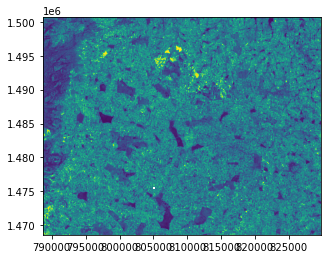

In [ ]:
_ = show(memfile.open())